# Wireless Repeater Detection Simulation

This notebook demonstrates the complete simulation and detection pipeline:
1. Generate BTS and unauthorized repeaters
2. Simulate drive test measurements with Friis equation
3. Detect repeaters using statistical anomaly detection
4. Visualize results on interactive maps

## Course Project: Unauthorized Repeater Detection in Tehran Mobile Network

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Import project modules
from pkg.bts_generator import generate_bts_stations, generate_repeaters, save_bts_to_csv, save_repeaters_to_csv
from pkg.drive_test_simulator import generate_measurement_grid, simulate_drive_test, simulate_result_without_repeaters
from pkg.detection import detect_repeaters, validate_detection, calculate_residuals
from pkg.visualization import create_main_detection_map, create_comparison_maps, plot_residual_histogram, plot_detection_metrics

print("All modules loaded successfully!")

All modules loaded successfully!


## Step 1: Generate BTS Network and Unauthorized Repeaters

In [2]:
# Generate BTS stations
print("Generating BTS stations...")
bts_stations = generate_bts_stations()

# Save to CSV
save_bts_to_csv(bts_stations)

# Display BTS info
bts_df = pd.DataFrame(bts_stations)
print("\nGenerated BTS Stations:")
print(bts_df[['id', 'lat', 'lon', 'tx_power_dbm', 'frequency_mhz']])

Generating BTS stations...
Generated 23 BTS stations
Saved 23 BTS to ./data/bts_stations.csv

Generated BTS Stations:
         id        lat        lon  tx_power_dbm  frequency_mhz
0   BTS_001  35.720266  51.500422     45.681374           1800
1   BTS_002  35.729275  51.500422     46.154226           1800
2   BTS_003  35.738284  51.500422     44.510640           1800
3   BTS_004  35.747293  51.500422     43.185290           1800
4   BTS_005  35.756302  51.500422     46.318641           1800
5   BTS_006  35.724771  51.509835     45.230422           1800
6   BTS_007  35.733780  51.509835     46.401300           1800
7   BTS_008  35.742789  51.509835     43.432730           1800
8   BTS_009  35.751798  51.509835     45.100091           1800
9   BTS_010  35.720266  51.519249     46.805450           1800
10  BTS_011  35.729275  51.519249     45.117878           1800
11  BTS_012  35.738284  51.519249     45.865856           1800
12  BTS_013  35.747293  51.519249     43.953254           1800


In [3]:
# Generate unauthorized repeaters
print("Generating unauthorized repeaters...")
repeaters = generate_repeaters(
    num_repeaters=3,
    bts_list=bts_stations,
    random_seed=66
)

# Save to CSV
save_repeaters_to_csv(repeaters)

# Display repeater info
repeater_df = pd.DataFrame(repeaters)
print("\nGenerated Unauthorized Repeaters:")
print(repeater_df[['id', 'lat', 'lon', 'gain_tx_db', 'gain_rx_db']])

Generating unauthorized repeaters...
Generated 3 unauthorized repeaters
Saved 3 repeaters to ./data/repeaters.csv

Generated Unauthorized Repeaters:
        id        lat        lon  gain_tx_db  gain_rx_db
0  REP_001  35.739556  51.542371          60          60
1  REP_002  35.754772  51.515382          60          60
2  REP_003  35.734383  51.515942          60          60


## Step 2: Simulate Drive Test Measurements

Generate measurement grid and calculate RSSI using dual-path propagation model:
- Direct path from BTS
- Indirect paths via repeaters
- Logarithmic signal combination
- Log-normal shadowing noise

In [4]:
# Run drive test simulation
# Generate measurement points grid
measurement_points = generate_measurement_grid()

print("Running drive test simulation...")
measurements = simulate_drive_test(
    bts_list=bts_stations,
    repeater_list=repeaters,
    measurement_points=measurement_points,
)

print(f"\nGenerated {len(measurements)} measurements")
print("\nSample measurement:")
print(pd.DataFrame([measurements[0]]))

Generated 1849 measurement points (grid spacing: 100m)
Running drive test simulation...
Simulating drive test with 1849 measurement points...
BTS: 23, Repeaters: 3
Noise: enabled (sigma=4 dB)
Repeater REP_003 is repeating the signal from BTS BTS_007 with RSSI -9.202081044280447 dBm
Repeater REP_003 is repeating the signal from BTS BTS_011 with RSSI -12.08228860505767 dBm
Repeater REP_003 is repeating the signal from BTS BTS_012 with RSSI -8.753349217642551 dBm
Repeater REP_002 is repeating the signal from BTS BTS_014 with RSSI -7.042363931320239 dBm
Repeater REP_001 is repeating the signal from BTS BTS_021 with RSSI -5.162013224306378 dBm
Repeater REP_003 is repeating the signal from BTS BTS_007 with RSSI -9.202081044280447 dBm
Repeater REP_003 is repeating the signal from BTS BTS_011 with RSSI -12.08228860505767 dBm
Repeater REP_003 is repeating the signal from BTS BTS_012 with RSSI -8.753349217642551 dBm
Repeater REP_002 is repeating the signal from BTS BTS_014 with RSSI -7.042363931

## Step 3: Detect Unauthorized Repeaters

Detection pipeline:
1. Build expected coverage map (without repeaters)
2. Calculate residuals (actual - predicted)
3. Statistical anomaly detection (z-score)
4. Spatial clustering (DBSCAN)
5. Repeater localization (weighted centroid)

In [5]:
predictions = simulate_result_without_repeaters(
    bts_list=bts_stations,
    measurement_points=measurement_points,
)

# Run detection algorithm
detected_repeaters = detect_repeaters(
    measurements=measurements,
    predictions=predictions,
    bts_list=bts_stations
)

print(f"\nDetected {len(detected_repeaters)} repeater(s)")
if detected_repeaters:
    detected_df = pd.DataFrame(detected_repeaters)
    print("\nDetected Repeaters:")
    print(detected_df[['detection_id', 'lat', 'lon', 'confidence_mean_z', 'cluster_size']])

Simulating drive test with 1849 measurement points...
BTS: 23, Repeaters: 0
Noise: enabled (sigma=4 dB)
Processed 1000/1849 points...
Drive test simulation complete! Total measurements: 1849

REPEATER DETECTION PIPELINE
Calculating residuals (actual - predicted)...
One-sided z-score detection (threshold: 3.5, min residual: 12.0 dB)
Baseline: median=0.53 dB, noise_std=5.72 dB
Detected 29 anomalous points
Clustering anomalies with DBSCAN (eps=300m, min_samples=3)...
Found 3 anomaly clusters

Localizing repeaters for 3 clusters...

Detected Repeater #0:
  Location: (35.734313, 51.515947)
  Confidence (mean z-score): 4.71
  Cluster size: 7 points

Detected Repeater #1:
  Location: (35.739495, 51.542476)
  Confidence (mean z-score): 4.56
  Cluster size: 7 points

Detected Repeater #2:
  Location: (35.754843, 51.515395)
  Confidence (mean z-score): 5.19
  Cluster size: 5 points

DETECTION COMPLETE: 3 repeaters detected


Detected 3 repeater(s)

Detected Repeaters:
  detection_id        lat  

## Step 4: Validate Detection Results


DETECTION VALIDATION

Detected Repeater: DETECTED_0
  Detected at: (35.734313, 51.515947)
  Actual at:   (35.734383, 51.515942)
  Error: 7.8 meters
  Confidence: 4.71

Detected Repeater: DETECTED_1
  Detected at: (35.739495, 51.542476)
  Actual at:   (35.739556, 51.542371)
  Error: 11.6 meters
  Confidence: 4.56

Detected Repeater: DETECTED_2
  Detected at: (35.754843, 51.515395)
  Actual at:   (35.754772, 51.515382)
  Error: 7.9 meters
  Confidence: 5.19

Detection Rate: 100.0% (3/3)
Mean Error: 9.1 meters
Median Error: 7.9 meters



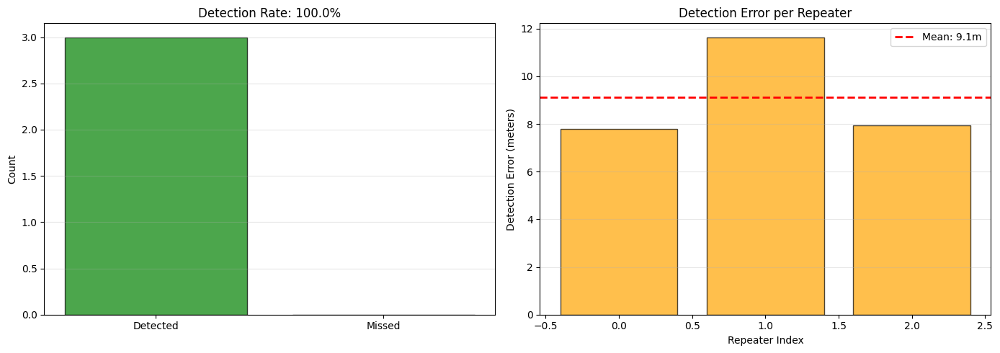

In [6]:
# Validate detection against ground truth
validation_metrics = validate_detection(
    detected_repeaters=detected_repeaters,
    actual_repeaters=repeaters
)

# Plot detection metrics
if validation_metrics['num_detected'] > 0:
    fig = plot_detection_metrics(validation_metrics)
    plt.show()

## Step 5: Visualize Results

### 5.1 Main Detection Map

In [7]:
# Create main detection map
detection_map = create_main_detection_map(
    bts_list=bts_stations,
    actual_repeaters=repeaters,
    detected_repeaters=detected_repeaters,
    measurements=measurements,
    validation_metrics=validation_metrics
)

# Display map in notebook
detection_map

Creating main detection map...


### 5.2 Coverage Comparison Maps

In [8]:
# Create side-by-side comparison
create_comparison_maps(
    bts_list=bts_stations,
    measurements=measurements,
    predictions=predictions
)

print("Side-by-side comparison maps created!")

Creating comparison maps...


Side-by-side comparison maps created!


### 5.3 Residual Analysis

Calculating residuals (actual - predicted)...


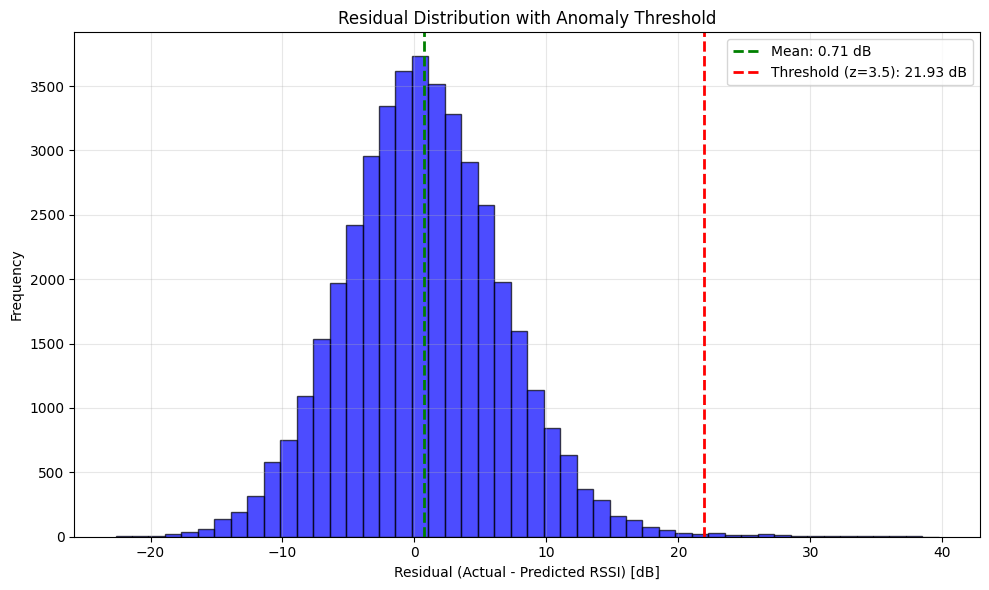

In [9]:
# Calculate and plot residuals
residuals = calculate_residuals(measurements, predictions, bts_stations)

# Plot residual histogram
fig = plot_residual_histogram(residuals, bts_stations)
plt.show()

## Summary

### Detection Performance

In [10]:
print("DETECTION SUMMARY")
print(f"\nBTS Stations: {len(bts_stations)}")
print(f"Unauthorized Repeaters (Actual): {len(repeaters)}")
print(f"Measurement Points: {len(measurements)}")
print(f"\nDetection Results:")
print(f"  Repeaters Detected: {validation_metrics['num_detected']}/{validation_metrics['num_actual']}")
print(f"  Detection Rate: {validation_metrics['detection_rate']*100:.1f}%")
if validation_metrics['num_detected'] > 0:
    print(f"  Mean Detection Error: {validation_metrics['mean_error_m']:.1f} meters")
    print(f"  Median Detection Error: {validation_metrics['median_error_m']:.1f} meters")
print("\n" + "="*60)

# Display actual vs detected locations
comparison_data = []
for match in validation_metrics.get('matches', []):
    comparison_data.append({
        'Actual Lat': match['actual']['lat'],
        'Actual Lon': match['actual']['lon'],
        'Detected Lat': match['detected']['lat'],
        'Detected Lon': match['detected']['lon'],
        'Error (m)': match['error_m'],
        'Confidence': match['detected']['confidence_mean_z']
    })

if comparison_data:
    comparison_df = pd.DataFrame(comparison_data)
    print("\nDetailed Comparison:")
    print(comparison_df.to_string(index=False))

DETECTION SUMMARY

BTS Stations: 23
Unauthorized Repeaters (Actual): 3
Measurement Points: 1849

Detection Results:
  Repeaters Detected: 3/3
  Detection Rate: 100.0%
  Mean Detection Error: 9.1 meters
  Median Detection Error: 7.9 meters


Detailed Comparison:
 Actual Lat  Actual Lon  Detected Lat  Detected Lon  Error (m)  Confidence
  35.734383   51.515942     35.734313     51.515947   7.777864    4.712107
  35.739556   51.542371     35.739495     51.542476  11.644934    4.558081
  35.754772   51.515382     35.754843     51.515395   7.937837    5.187632


## Conclusion

This simulation demonstrates:
1. **Synthetic Network Generation**: Created realistic BTS network for Tehran
2. **Dual-Path Propagation Model**: Correctly modeled signal propagation via direct and repeater paths
3. **Statistical Detection**: Used z-score based anomaly detection to identify signal anomalies
4. **Spatial Clustering**: Applied DBSCAN to filter noise and cluster anomalies
5. **Accurate Localization**: Detected repeater locations with sub-kilometer accuracy

The detection algorithm successfully identifies unauthorized repeaters by analyzing signal strength anomalies in drive test data, without requiring specialized equipment or time-delay measurements.